# Multimodal Liana Plus

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import liana as li
import mudata as mu
from matplotlib import pyplot as plt

In [3]:
mdata = mu.read("/nfs/home/students/i.kaciran/FoPra_PLAs/data/datasets/python_objekte/gated_sepsis_with_metadata.h5mu")

/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/mudata/_core/mudata.py:1471: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/mudata/_core/mudata.py:613: UserWarning: Cannot join columns with the same name because var_names are intersecting.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/mudata/_core/mudata.py:1322: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.


In [4]:
mdata

MuData object with n_obs × n_vars = 285043 × 37679
  obs:	'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'sample', 'donor_id', 'cell_barcodes', 'scRNA.seq', 'TCR', 'BCR', 'CITE.seq', 'Bulk.RNA.seq', 'Olink.proteomics', 'Gender', 'Age', 'Sample.Collection.Date', 'Sample.Collection.Site', 'Group', 'Sepsis.Infection.Source', 'Ethnicity', 'Chronic.comorbidity.None', 'Cardiovascular.compromise', 'COPD', 'Hypertension', 'Diabetes', 'Respiratory.insufficiency', 'Renal.insufficiency', 'Tuberculosis', 'Length.of.ICU.stay.days', 'Length.of.hospital.stay.days', 'X14.day.mortality..Deceased.1.Living.0.', 'X28.day.mortality..Deceased.1.Living.0.', 'X90.day.mortality..Deceased.1.Living.0.', 'Gram.positive.bacteria', 'Gram.negative.bacteria', 'Virus', 'Fungi', 'Microbiology.laboratory..Unknown', 'SOFA.score', 'Shock', 'Organ.failure', 'Mechanical.ventilation', 'percent.mt', 'percent.ribo', 'percent.hb', 'mt_outlier_all', 'is_outlier_RNA', 'is_outlier_protein', 'is_outlier', 'scDblFinder.class', 'scDblFinder.score', 'RNA_snn_res.0.8', 'seurat_clusters', 'RNA_snn_res.0.25', 'RNA.weight', 'ADT.weight', 'leiden_0.8_totalVI', 'leiden_0.25_totalVI', 'celltype_full', 'lineage', 'pla_status', 'celltype', 'Dataset', 'Cohort', 'Condition', 'Sex', 'Ethnicity_Race', 'inner_batch_effect', 'patient_ID', 'sample_ID'
  2 modalities
    rna:	285043 × 37471
    adt:	285043 × 208

In [5]:
mdata.obs['lineage'] = mdata.obs['lineage'].astype('category')
mdata.obs['lineage'] = mdata.obs['lineage'].fillna("Unassigned")
mdata.obs['pla_status'] = mdata.obs['pla_status'].fillna("platelet-free")

## Infer Interactions

CITE-seq data often focuses on antibody tagging of surface proteins, primarily receptors. To ensure only the protein modality is used for receptors, we append 'AB:' to receptor names in the antibody data. This step is necessary only when both RNA and antibody data have matching feature names.

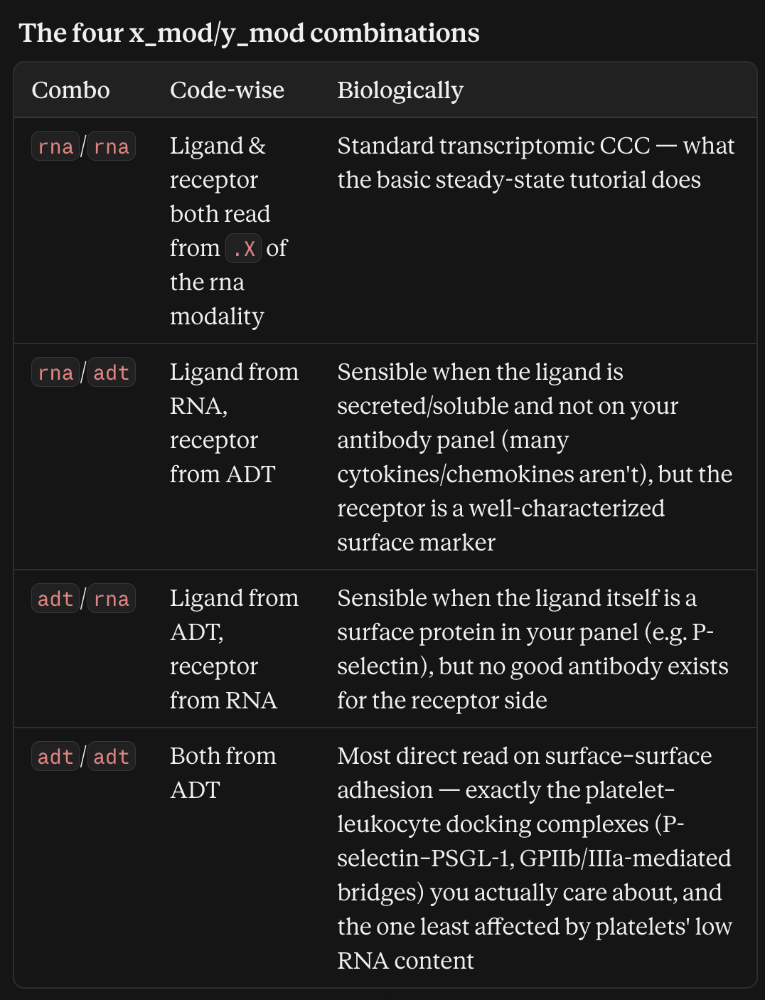

When x_mod and y_mod point at two different modality keys but those modalities contain identical feature names, LIANA's mdata_to_anndata concatenates them into one combined object: duplicate var_names are then unreliable. SO we give for ADT/ADT the ligand-role copy and receptor-role copy different name prefixes and not just different modality keys.

In [6]:
# ---- resource ----
resource = li.rs.select_resource(resource_name='consensus')

def prefix_complex(entry, prefix, sep='_'):
    return sep.join(prefix + s for s in entry.split(sep))

# ---- ADT var_names ----
adt_plain_names = mdata.mod['adt'].var_names.astype(str)

mdata.mod['adt'].var_names = 'AB:' + adt_plain_names

# create adt_x / adt_y as copies of adt
mdata.mod['adt_x'] = mdata.mod['adt'].copy()
mdata.mod['adt_y'] = mdata.mod['adt'].copy()
mdata.mod['adt_x'].var_names = 'ABL:' + adt_plain_names
mdata.mod['adt_y'].var_names = 'ABR:' + adt_plain_names

old_obs = mdata.obs.copy()

mdata = mu.MuData(mdata.mod)
mdata.obs = old_obs.loc[mdata.obs_names].copy()

# ---- resource variants ----
res_rna_adt = resource.copy()
res_rna_adt['receptor'] = [prefix_complex(e, 'AB:') for e in res_rna_adt['receptor']]

res_adt_rna = resource.copy()
res_adt_rna['ligand'] = [prefix_complex(e, 'AB:') for e in res_adt_rna['ligand']]

res_adt_adt = resource.copy()
res_adt_adt['ligand']   = [prefix_complex(e, 'ABL:') for e in res_adt_adt['ligand']]
res_adt_adt['receptor'] = [prefix_complex(e, 'ABR:') for e in res_adt_adt['receptor']]

/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/mudata/_core/mudata.py:1471: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/mudata/_core/mudata.py:1322: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.


In [7]:
print('lineage' in mdata.obs.columns, 'pla_status' in mdata.obs.columns)

True True


In [8]:
res_adt_rna

,ligand,receptor
0,AB:LGALS9,PTPRC
1,AB:LGALS9,MET
2,AB:LGALS9,CD44
3,AB:LGALS9,LRP1
4,AB:LGALS9,CD47
...,...,...
4619,AB:BMP2,ACTR2
4620,AB:BMP15,ACTR2
4621,AB:CSF1,CSF3R
4622,AB:IL36G,IFNAR1


In [9]:
res_rna_adt

,ligand,receptor
0,LGALS9,AB:PTPRC
1,LGALS9,AB:MET
2,LGALS9,AB:CD44
3,LGALS9,AB:LRP1
4,LGALS9,AB:CD47
...,...,...
4619,BMP2,AB:ACTR2
4620,BMP15,AB:ACTR2
4621,CSF1,AB:CSF3R
4622,IL36G,AB:IFNAR1


In [10]:
res_adt_adt

,ligand,receptor
0,ABL:LGALS9,ABR:PTPRC
1,ABL:LGALS9,ABR:MET
2,ABL:LGALS9,ABR:CD44
3,ABL:LGALS9,ABR:LRP1
4,ABL:LGALS9,ABR:CD47
...,...,...
4619,ABL:BMP2,ABR:ACTR2
4620,ABL:BMP15,ABR:ACTR2
4621,ABL:CSF1,ABR:CSF3R
4622,ABL:IL36G,ABR:IFNAR1


If we have complexes (ITGA2B_ITGB3) and LIANA later splits this on _ to check/score each subunit individually, it gets ['AB:ITGA2B', 'ITGB3'] — the first subunit correctly points at the ADT panel, but the second silently reverts to looking for a plain-gene match. For adt/adt, that second subunit won't be found in the ADT modality at all (since only AB:-prefixed names exist there) and the whole complex gets dropped; for rna/adt, it could even wrongly resolve against the RNA modality instead.

In [11]:
adt_x_names = set(mdata.mod['adt_x'].var_names)
adt_y_names = set(mdata.mod['adt_y'].var_names)
adt_names = set(mdata.mod['adt'].var_names)


def complex_fully_matched(entry, names, sep='_'):
    subunits = entry.split(sep)
    return all(s in names for s in subunits)

checks = [
    ('rna_adt', res_rna_adt, 'receptor', adt_names),      # original AB: set, still fine
    ('adt_rna', res_adt_rna, 'ligand', adt_names),
    ('adt_adt/ligand', res_adt_adt, 'ligand', adt_x_names),
    ('adt_adt/receptor', res_adt_adt, 'receptor', adt_y_names),
]

for name, res, col, names in checks:
    entries = res[col].unique()
    fully_matched = [e for e in entries if complex_fully_matched(e, names)]
    n_complexes = sum('_' in e for e in entries)
    n_complexes_matched = sum('_' in e for e in fully_matched)
    print(f"{name}: {len(fully_matched)}/{len(entries)} entries fully matched "
          f"({n_complexes_matched}/{n_complexes} of them are complexes)")

rna_adt: 29/1052 entries fully matched (0/167 of them are complexes)
adt_rna: 19/1027 entries fully matched (0/15 of them are complexes)
adt_adt/ligand: 19/1027 entries fully matched (0/15 of them are complexes)
adt_adt/receptor: 29/1052 entries fully matched (0/167 of them are complexes)


In [12]:
adt_x_names = set(mdata.mod['adt_x'].var_names)
adt_y_names = set(mdata.mod['adt_y'].var_names)

ligand_entries = res_adt_adt['ligand'].unique()
receptor_entries = res_adt_adt['receptor'].unique()

ligand_matched = set(e for entry in ligand_entries for e in entry.split('_')) & adt_x_names
receptor_matched = set(e for entry in receptor_entries for e in entry.split('_')) & adt_y_names

print('adt_adt ligand (ABL:) match:', len(ligand_matched))
print('adt_adt receptor (ABR:) match:', len(receptor_matched))

adt_adt ligand (ABL:) match: 19
adt_adt receptor (ABR:) match: 29


We need to ensure that data from the different modalities is comparable, which often requires the transformation of the data. In this case, we use zero-inflated min-max normalization to ensure that the data from the two modalities is comparable. Essentially, a min-max normalization in which any value below 0.5 (by default) following normalization is set to 0. This normalization was originally introduced by the CiteFuse method, which is a ligand-receptor method for CITE-seq data.

In [13]:
# rna -> adt
li.mt.rank_aggregate(
    adata=mdata, groupby='lineage', resource=res_rna_adt,
    mdata_kwargs={'x_mod': 'rna', 'y_mod': 'adt', 'x_use_raw': False, 'y_use_raw': False,
                  'x_transform': li.ut.zi_minmax, 'y_transform': li.ut.zi_minmax},
    key_added='liana_res_rna_adt', verbose=True,
)

# adt -> rna
li.mt.rank_aggregate(
    adata=mdata, groupby='lineage', resource=res_adt_rna,
    mdata_kwargs={'x_mod': 'adt', 'y_mod': 'rna', 'x_use_raw': False, 'y_use_raw': False,
                  'x_transform': li.ut.zi_minmax, 'y_transform': li.ut.zi_minmax},
    key_added='liana_res_adt_rna', verbose=True,
)

# adt -> adt
li.mt.rank_aggregate(
    adata=mdata, groupby='lineage', resource=res_adt_adt,
    mdata_kwargs={'x_mod': 'adt_x', 'y_mod': 'adt_y', 'x_use_raw': False, 'y_use_raw': False,
                  'x_transform': li.ut.zi_minmax, 'y_transform': li.ut.zi_minmax},
    key_added='liana_res_adt_adt', verbose=True,
)

Using provided `resource`.


Using `.X`!


Transforming rna using zi_minmax


Using `.X`!


Transforming adt using zi_minmax


Using `.X`!
8623 features of mat are empty, they will be removed.
3731 samples of mat are empty, they will be removed.
Make sure that normalized counts are passed!
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:164: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:167: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
0.53 of entities in the resource are missing from the data.


Generating ligand-receptor stats for 285043 samples and 182 features


/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:288: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:293: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:296: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)


Assuming that counts were `natural` log-normalized!
Running CellPhoneDB


100%|██████████| 1000/1000 [01:52<00:00,  8.93it/s]


Running Connectome
Running log2FC
Running NATMI
Running SingleCellSignalR
Using provided `resource`.


Using `.X`!


Transforming adt using zi_minmax


Using `.X`!


Transforming rna using zi_minmax


Using `.X`!
8623 features of mat are empty, they will be removed.
3731 samples of mat are empty, they will be removed.
Make sure that normalized counts are passed!
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:164: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:167: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
0.55 of entities in the resource are missing from the data.


Generating ligand-receptor stats for 285043 samples and 61 features


/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:288: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:293: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:296: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)


Assuming that counts were `natural` log-normalized!
Running CellPhoneDB


100%|██████████| 1000/1000 [01:17<00:00, 12.84it/s]


Running Connectome
Running log2FC
Running NATMI
Running SingleCellSignalR
Using provided `resource`.


Using `.X`!


Transforming adt_x using zi_minmax


Using `.X`!


Transforming adt_y using zi_minmax


Using `.X`!
283256 samples of mat are empty, they will be removed.
Make sure that normalized counts are passed!
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:167: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
0.98 of entities in the resource are missing from the data.


Generating ligand-receptor stats for 285043 samples and 15 features


/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:288: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:293: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:296: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)


Assuming that counts were `natural` log-normalized!
Running CellPhoneDB


100%|██████████| 1000/1000 [00:56<00:00, 17.71it/s]


Running Connectome
Running log2FC
Running NATMI
Running SingleCellSignalR


In [14]:
mdata.uns['liana_res_rna_adt']

,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank
998,DCs,CD4 T cells,HLA-DRA,AB:CD4,0.004409,0.0,0.000006,0.229826,0.008632,0.607767,0.893502,0.000003,0.000003
997,DCs,CD4 T cells,HLA-DQB1,AB:CD4,0.002904,0.0,0.000004,0.198378,0.005688,0.609454,0.868920,0.000029,0.000047
992,DCs,CD4 T cells,HLA-DMB,AB:CD4,0.002678,0.0,0.000004,0.175826,0.005027,0.511483,0.863439,0.000029,0.000142
1107,DCs,DCs,HLA-DRA,AB:CD4,0.004097,0.0,0.000001,0.201765,0.007883,0.136345,0.798946,0.000011,0.000186
993,DCs,CD4 T cells,HLA-DPA1,AB:CD4,0.002676,0.0,0.000004,0.171311,0.005085,0.587247,0.863385,0.000029,0.000186
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2960,neutrophils,neutrophils,TNFSF13B,AB:CD40,0.000000,1.0,0.000000,0.021188,0.000683,0.000000,0.000000,0.323999,1.000000
2961,neutrophils,neutrophils,VCAN,AB:CD44,0.000000,1.0,0.000000,0.011938,0.000303,0.000000,0.000000,0.810027,1.000000
2962,neutrophils,neutrophils,VCAN,AB:EGFR,0.000000,1.0,0.000000,0.011429,0.000299,0.000000,0.000000,0.857483,1.000000
2963,neutrophils,neutrophils,VIM,AB:CD44,0.000000,1.0,0.000000,-0.012839,-0.000336,0.000000,0.000000,1.000000,1.000000


In [15]:
mdata.uns['liana_res_adt_rna']

,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank
388,DCs,CD8 T cells,AB:CD48,CD2,0.001065,0.0,1.133900e-06,0.091803,0.001876,0.429652,0.778513,0.000054,0.000644
527,Monocytes,DCs,AB:CD14,TLR1,0.002582,0.0,4.076467e-07,0.070565,0.003625,0.260117,0.678201,0.000054,0.000926
441,DCs,NK cells,AB:CD48,CD244,0.000971,0.0,9.259010e-07,0.076980,0.001607,0.218889,0.760550,0.000054,0.001643
544,Monocytes,Monocytes,AB:CD14,TLR1,0.001733,0.0,2.714633e-07,0.040879,0.002104,0.173219,0.632331,0.000207,0.002076
811,Unassigned,NK cells,AB:CD99,PILRA,0.000774,0.0,2.630192e-07,0.032162,0.001150,0.272351,0.628650,0.000095,0.002561
...,...,...,...,...,...,...,...,...,...,...,...,...,...
970,neutrophils,neutrophils,AB:CD47,SIRPA,0.000000,1.0,0.000000e+00,0.007026,0.000191,0.000000,0.000000,1.000000,1.000000
971,neutrophils,neutrophils,AB:CD52,SIGLEC10,0.000000,1.0,0.000000e+00,0.017919,0.000626,0.000000,0.000000,0.543063,1.000000
972,neutrophils,neutrophils,AB:CD99,CD81,0.000000,1.0,0.000000e+00,-0.008371,-0.000108,0.000000,0.000000,1.000000,1.000000
973,neutrophils,neutrophils,AB:CD99,PILRA,0.000000,1.0,0.000000e+00,-0.000624,0.000088,0.000000,0.000000,1.000000,1.000000


In [16]:
mdata.uns['liana_res_adt_adt']

,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank
218,DCs,CD4 T cells,ABL:CD48,ABR:CD2,0.000601,0.000,1.151672e-07,0.065139,0.001066,0.504070,0.913751,0.000003,0.000093
227,DCs,CD8 T cells,ABL:CD48,ABR:CD2,0.000558,0.000,2.051148e-08,0.054590,0.000962,0.089776,0.817219,0.000144,0.000832
12,B cells,CD4 T cells,ABL:CD48,ABR:CD2,0.000201,0.001,3.120704e-08,0.019674,0.000277,0.136589,0.846505,0.000103,0.002301
265,DCs,Unassigned,ABL:CD48,ABR:CD2,0.000555,0.000,1.434431e-08,0.053902,0.000952,0.062783,0.788983,0.000144,0.002301
434,Unassigned,B cells,ABL:CD70,ABR:CD27,0.000174,0.000,1.177176e-08,0.026362,0.000311,0.250203,0.772060,0.000009,0.003307
...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,B cells,DCs,ABL:CD80,ABR:CD28,0.000000,1.000,0.000000e+00,0.005150,0.000027,0.000000,0.000000,0.606803,1.000000
36,B cells,DCs,ABL:CD86,ABR:CD28,0.000000,1.000,0.000000e+00,-0.002478,-0.000013,0.000000,0.000000,1.000000,1.000000
37,B cells,DCs,ABL:CD99,ABR:CD81,0.000000,1.000,0.000000e+00,-0.007153,-0.000096,0.000000,0.000000,1.000000,1.000000
38,B cells,Monocytes,ABL:CD274,ABR:CD80,0.000000,1.000,0.000000e+00,-0.002245,-0.000012,0.000000,0.000000,1.000000,1.000000


## Plotting

In [17]:
lineages = mdata.obs['lineage'].unique().tolist()
print(lineages)

['Unassigned', 'neutrophils', 'B cells', 'CD4 T cells', 'CD8 T cells', 'NK cells', 'Monocytes', 'DCs']


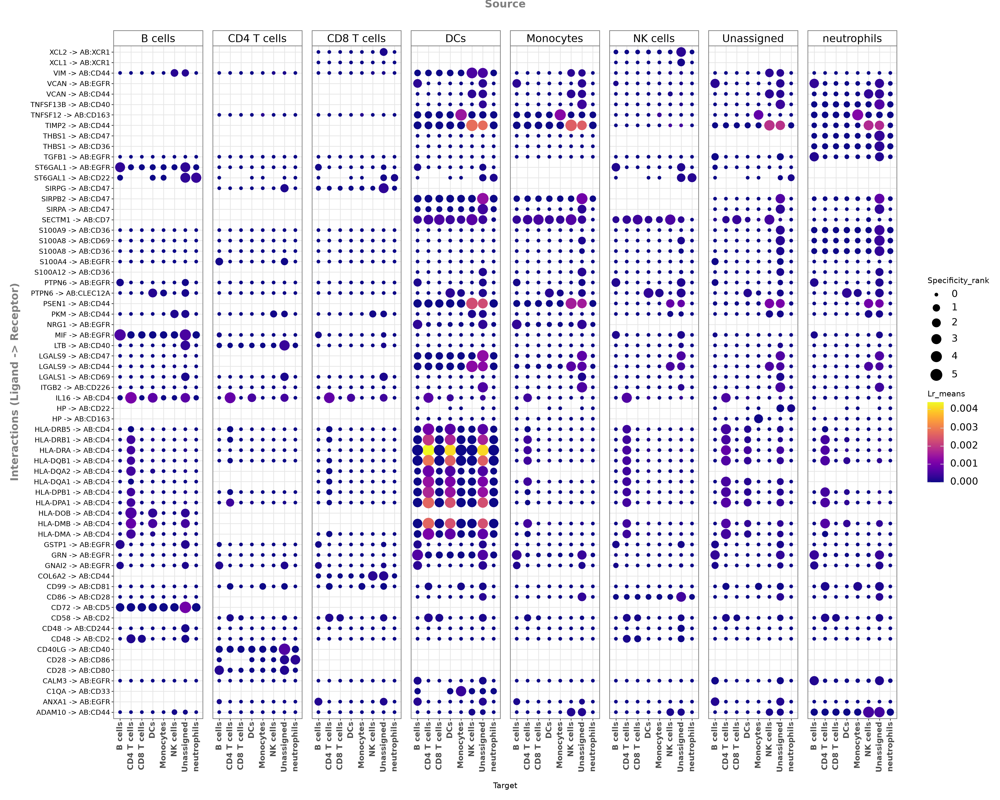

In [18]:
li.pl.dotplot(adata=mdata,
              uns_key='liana_res_rna_adt',
              colour='lr_means',
              size='specificity_rank',
              inverse_size=True,
              source_labels=lineages,  
              target_labels=lineages,
              figure_size=(20, 16),
              filter_fun=lambda x: x['cellphone_pvals'] <= 0.05,
              cmap='plasma')

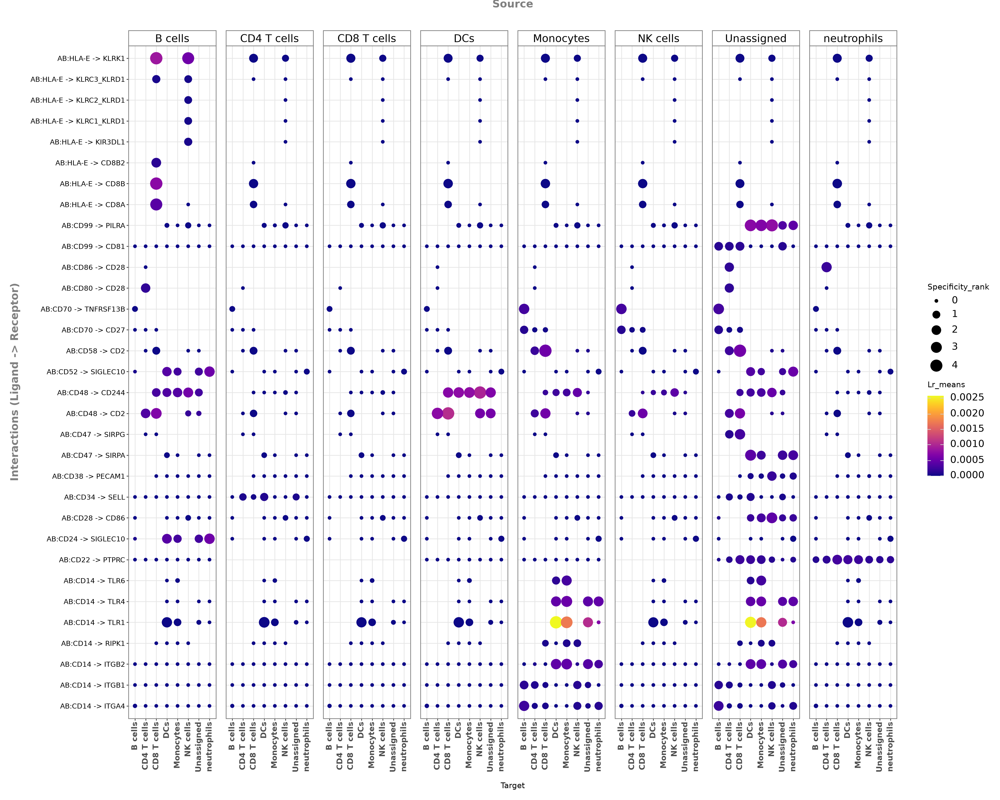

In [19]:
li.pl.dotplot(adata=mdata,
              uns_key='liana_res_adt_rna',   
              colour='lr_means',
              size='specificity_rank',
              inverse_size=True,
              source_labels=lineages,  
              target_labels=lineages,
              figure_size=(20,16),
              filter_fun=lambda x: x['cellphone_pvals'] <= 0.05,
              cmap='plasma')

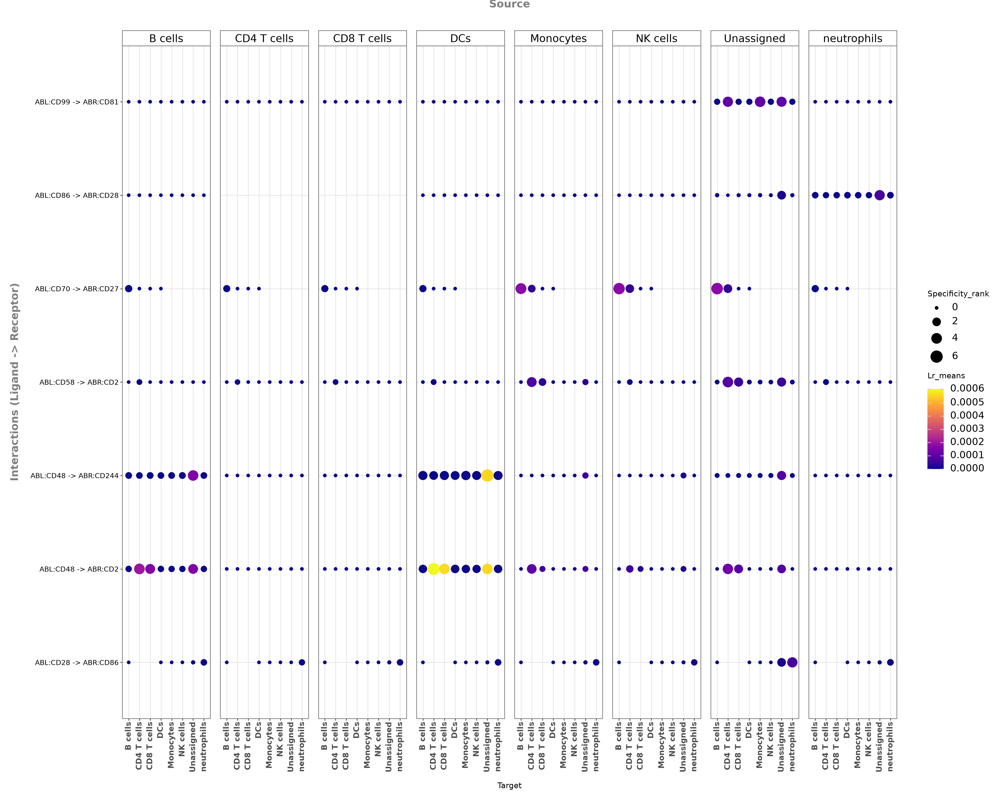

In [20]:

li.pl.dotplot(adata=mdata,
              uns_key='liana_res_adt_adt', 
              colour='lr_means',
              size='specificity_rank',
              inverse_size=True,
              source_labels=lineages,
              target_labels=lineages,
              figure_size=(20,16),
              filter_fun=lambda x: x['cellphone_pvals'] <= 0.05,
              cmap='plasma')

## PLA Only

In [21]:
print(mdata)  # should list rna, adt, adt_x, adt_y as 4 modalities, all aligned

MuData object with n_obs × n_vars = 285043 × 38095
  obs:	'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'sample', 'donor_id', 'cell_barcodes', 'scRNA.seq', 'TCR', 'BCR', 'CITE.seq', 'Bulk.RNA.seq', 'Olink.proteomics', 'Gender', 'Age', 'Sample.Collection.Date', 'Sample.Collection.Site', 'Group', 'Sepsis.Infection.Source', 'Ethnicity', 'Chronic.comorbidity.None', 'Cardiovascular.compromise', 'COPD', 'Hypertension', 'Diabetes', 'Respiratory.insufficiency', 'Renal.insufficiency', 'Tuberculosis', 'Length.of.ICU.stay.days', 'Length.of.hospital.stay.days', 'X14.day.mortality..Deceased.1.Living.0.', 'X28.day.mortality..Deceased.1.Living.0.', 'X90.day.mortality..Deceased.1.Living.0.', 'Gram.positive.bacteria', 'Gram.negative.bacteria', 'Virus', 'Fungi', 'Microbiology.laboratory..Unknown', 'SOFA.score', 'Shock', 'Organ.failure', 'Mechanical.ventilation', 'percent.mt', 'percent.ribo', 'percent.hb', 'mt_outlier_all', 'is_outlier_RNA', 'is_outlier_protein', 'is_outlier',

In [22]:
print(mdata.obs['pla_status'].unique())

['platelet-free', 'PLA']
Categories (2, object): ['PLA', 'platelet-free']


In [23]:
mdata_pla = mdata[mdata.obs['pla_status'] == 'PLA'].copy()

/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/mudata/_core/mudata.py:1471: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/mudata/_core/mudata.py:1322: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.


In [24]:
# rna -> adt
li.mt.rank_aggregate(
    adata=mdata_pla, groupby='lineage', resource=res_rna_adt,
    mdata_kwargs={'x_mod': 'rna', 'y_mod': 'adt', 'x_use_raw': False, 'y_use_raw': False,
                  'x_transform': li.ut.zi_minmax, 'y_transform': li.ut.zi_minmax},
    key_added='liana_res_rna_adt_pla', verbose=True,
)

# adt -> rna
li.mt.rank_aggregate(
    adata=mdata_pla, groupby='lineage', resource=res_adt_rna,
    mdata_kwargs={'x_mod': 'adt', 'y_mod': 'rna', 'x_use_raw': False, 'y_use_raw': False,
                  'x_transform': li.ut.zi_minmax, 'y_transform': li.ut.zi_minmax},
    key_added='liana_res_adt_rna_pla', verbose=True,
)

# adt -> adt
li.mt.rank_aggregate(
    adata=mdata_pla, groupby='lineage', resource=res_adt_adt,
    mdata_kwargs={'x_mod': 'adt_x', 'y_mod': 'adt_y', 'x_use_raw': False, 'y_use_raw': False,
                  'x_transform': li.ut.zi_minmax, 'y_transform': li.ut.zi_minmax},
    key_added='liana_res_adt_adt_pla', verbose=True,
)

Using provided `resource`.


Using `.X`!


Transforming rna using zi_minmax


Using `.X`!


Transforming adt using zi_minmax


Using `.X`!
12537 features of mat are empty, they will be removed.
13 samples of mat are empty, they will be removed.
Make sure that normalized counts are passed!
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:164: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:167: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
0.60 of entities in the resource are missing from the data.


Generating ligand-receptor stats for 39405 samples and 164 features


/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:288: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:293: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:296: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)


Assuming that counts were `natural` log-normalized!
Running CellPhoneDB


100%|██████████| 1000/1000 [00:16<00:00, 61.79it/s]


Running Connectome
Running log2FC
Running NATMI
Running SingleCellSignalR
Using provided `resource`.


Using `.X`!


Transforming adt using zi_minmax


Using `.X`!


Transforming rna using zi_minmax


Using `.X`!
12537 features of mat are empty, they will be removed.
13 samples of mat are empty, they will be removed.
Make sure that normalized counts are passed!
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:164: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:167: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
0.59 of entities in the resource are missing from the data.


Generating ligand-receptor stats for 39405 samples and 61 features


/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:288: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:293: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:296: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)


Assuming that counts were `natural` log-normalized!
Running CellPhoneDB


100%|██████████| 1000/1000 [00:09<00:00, 106.50it/s]


Running Connectome
Running log2FC
Running NATMI
Running SingleCellSignalR
Using provided `resource`.


Using `.X`!


Transforming adt_x using zi_minmax


Using `.X`!


Transforming adt_y using zi_minmax


Using `.X`!
37416 samples of mat are empty, they will be removed.
Make sure that normalized counts are passed!
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:167: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
The following cell identities were excluded: Unassigned, neutrophils
0.98 of entities in the resource are missing from the data.


Generating ligand-receptor stats for 39405 samples and 15 features


/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:288: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:293: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:296: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)


Assuming that counts were `natural` log-normalized!
Running CellPhoneDB


100%|██████████| 1000/1000 [00:05<00:00, 169.08it/s]


Running Connectome
Running log2FC
Running NATMI
Running SingleCellSignalR


In [25]:
mdata_pla.uns['liana_res_rna_adt_pla']

,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank
1002,DCs,DCs,GRN,AB:EGFR,0.022297,0.000,4.569784e-04,0.340529,0.036311,0.309524,0.951567,0.000657,0.000007
1030,DCs,DCs,PTPN6,AB:EGFR,0.019047,0.000,2.708742e-04,0.369392,0.034187,0.421822,0.937990,0.000529,0.000026
1333,Monocytes,DCs,GRN,AB:EGFR,0.019011,0.000,2.688153e-04,0.287337,0.032760,0.182076,0.937768,0.000657,0.000059
1026,DCs,DCs,NRG1,AB:EGFR,0.017979,0.000,2.097470e-04,0.299326,0.029861,0.300695,0.930122,0.000657,0.000104
187,B cells,DCs,MIF,AB:EGFR,0.017593,0.000,1.876206e-04,0.547640,0.032730,0.564322,0.926412,0.000090,0.000163
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1772,NK cells,NK cells,VCAN,AB:CD44,0.000663,0.061,3.755506e-07,0.045324,0.000780,0.394706,0.360300,0.107449,1.000000
1773,NK cells,NK cells,VCAN,AB:EGFR,0.000000,1.000,0.000000e+00,-0.030655,-0.003606,0.000000,0.000000,1.000000,1.000000
1774,NK cells,NK cells,VIM,AB:CD44,0.000315,0.375,9.014564e-08,0.030215,0.000179,0.070044,0.216269,0.205954,1.000000
1775,NK cells,NK cells,XCL1,AB:XCR1,0.000000,1.000,0.000000e+00,0.094122,0.003714,0.000000,0.000000,0.886372,1.000000


In [26]:
mdata_pla.uns['liana_res_adt_rna_pla']

,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank
61,B cells,DCs,AB:CD38,PECAM1,0.005863,0.0,0.000034,0.306129,0.011051,0.628999,0.843436,0.000168,0.001334
392,DCs,Monocytes,AB:CD47,SIRPA,0.005693,0.0,0.000032,0.129521,0.010028,0.176093,0.839478,0.002252,0.002606
374,DCs,DCs,AB:CD47,SIRPA,0.005645,0.0,0.000032,0.128486,0.007464,0.172989,0.838276,0.002398,0.003398
378,DCs,DCs,AB:CD99,PILRA,0.005528,0.0,0.000026,0.153459,0.008568,0.408815,0.824009,0.000432,0.005292
80,B cells,Monocytes,AB:CD47,SIRPA,0.004831,0.0,0.000023,0.092671,0.007995,0.124472,0.814705,0.006153,0.006393
...,...,...,...,...,...,...,...,...,...,...,...,...,...
626,NK cells,NK cells,AB:HLA-E,KLRC1_KLRD1,0.000000,1.0,0.000000,0.078531,0.002469,0.000000,0.000000,0.792384,1.000000
627,NK cells,NK cells,AB:HLA-E,KLRC2_KLRD1,0.000000,1.0,0.000000,0.097185,0.003657,0.000000,0.000000,0.446360,1.000000
628,NK cells,NK cells,AB:HLA-E,KLRC3_KLRD1,0.000000,1.0,0.000000,0.097185,0.003657,0.000000,0.000000,0.446360,1.000000
629,NK cells,NK cells,AB:HLA-E,KLRK1,0.000000,1.0,0.000000,0.062961,0.006727,0.000000,0.000000,0.609114,1.000000


In [27]:
mdata_pla.uns['liana_res_adt_adt_pla']

,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank
197,DCs,CD8 T cells,ABL:CD48,ABR:CD2,0.002273,0.000,0.000005,0.086543,0.003610,0.297740,0.888362,0.000122,0.000252
187,DCs,CD4 T cells,ABL:CD48,ABR:CD2,0.002212,0.000,0.000004,0.083133,0.003502,0.275043,0.884369,0.000208,0.001006
23,B cells,CD8 T cells,ABL:CD48,ABR:CD2,0.001422,0.078,0.000002,0.043857,0.001850,0.125346,0.837745,0.000887,0.012104
13,B cells,CD4 T cells,ABL:CD48,ABR:CD2,0.001361,0.099,0.000002,0.040446,0.001742,0.115791,0.832283,0.001051,0.015752
255,Monocytes,CD8 T cells,ABL:CD48,ABR:CD2,0.001281,0.000,0.000002,0.036770,0.001839,0.096726,0.819349,0.002152,0.019864
...,...,...,...,...,...,...,...,...,...,...,...,...,...
344,NK cells,NK cells,ABL:CD58,ABR:CD2,0.000000,1.000,0.000000,-0.020467,-0.000688,0.000000,0.000000,1.000000,1.000000
345,NK cells,NK cells,ABL:CD80,ABR:CD28,0.000000,1.000,0.000000,-0.005038,-0.000067,0.000000,0.000000,1.000000,1.000000
346,NK cells,NK cells,ABL:CD86,ABR:CD28,0.000000,1.000,0.000000,-0.008553,-0.000163,0.000000,0.000000,1.000000,1.000000
347,NK cells,NK cells,ABL:CD99,ABR:CD81,0.000000,1.000,0.000000,-0.017634,-0.000607,0.000000,0.000000,1.000000,1.000000


In [28]:
lineages_pla = mdata_pla.obs['lineage'].unique().tolist()
print(lineages_pla)

['CD8 T cells', 'CD4 T cells', 'Monocytes', 'NK cells', 'DCs', 'B cells']


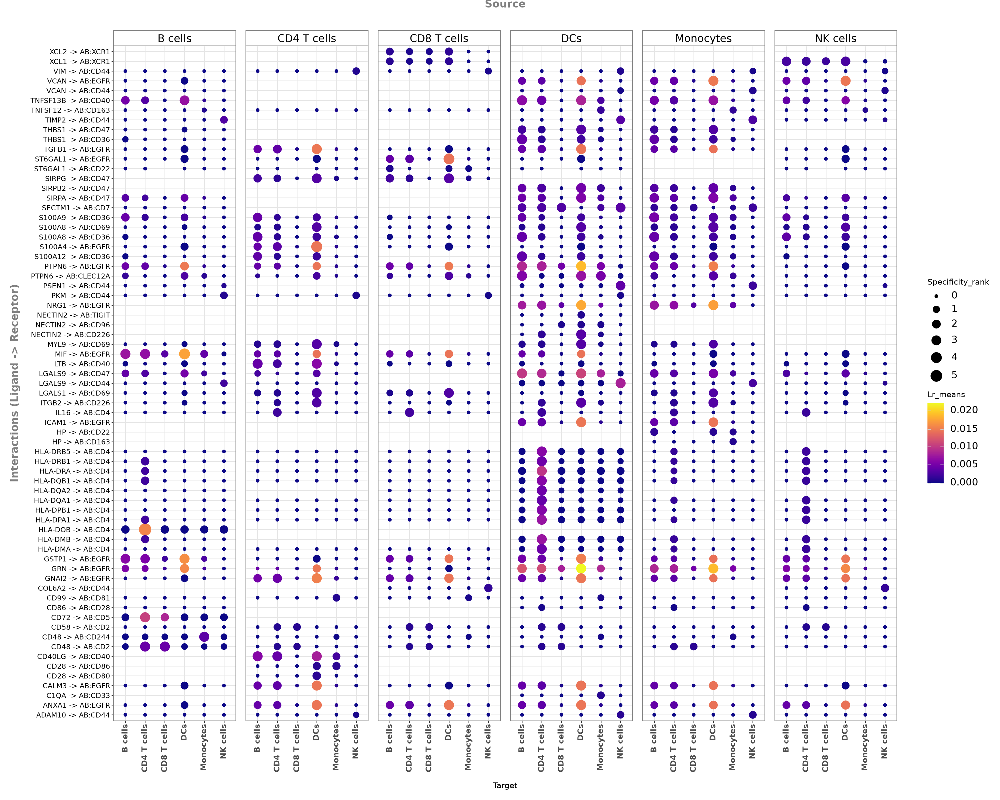

In [29]:
li.pl.dotplot(adata=mdata_pla,
              uns_key='liana_res_rna_adt_pla',
              colour='lr_means',
              size='specificity_rank',
              inverse_size=True,
              source_labels=lineages_pla,  
              target_labels=lineages_pla,
              figure_size=(20, 16),
              filter_fun=lambda x: x['cellphone_pvals'] <= 0.05,
              cmap='plasma')

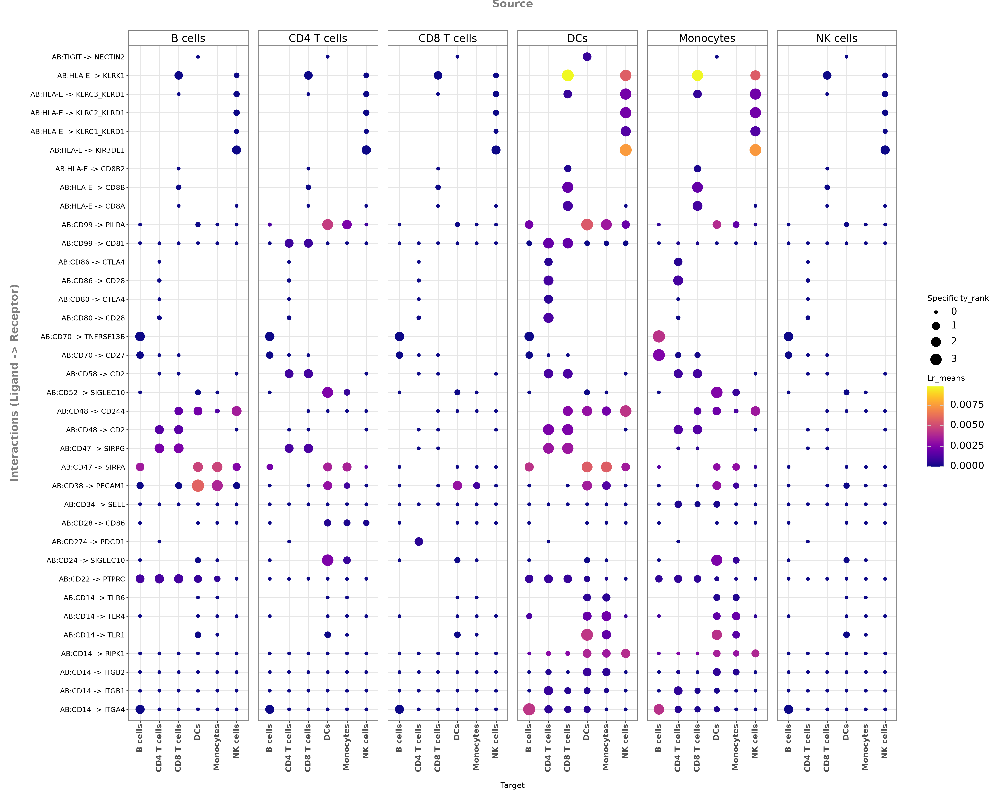

In [30]:
li.pl.dotplot(adata=mdata_pla,
              uns_key='liana_res_adt_rna_pla',   
              colour='lr_means',
              size='specificity_rank',
              inverse_size=True,
              source_labels=lineages_pla,  
              target_labels=lineages_pla,
              figure_size=(20,16),
              filter_fun=lambda x: x['cellphone_pvals'] <= 0.05,
              cmap='plasma')

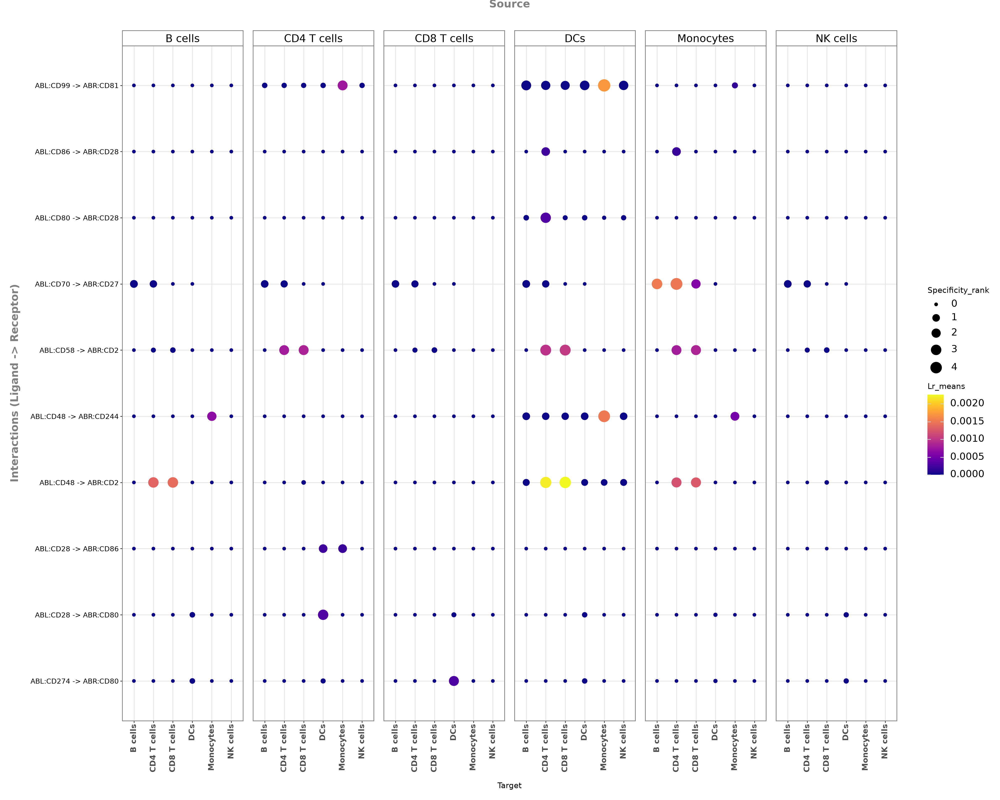

In [31]:

li.pl.dotplot(adata=mdata_pla,
              uns_key='liana_res_adt_adt_pla', 
              colour='lr_means',
              size='specificity_rank',
              inverse_size=True,
              source_labels=lineages_pla,
              target_labels=lineages_pla,
              figure_size=(20,16),
              filter_fun=lambda x: x['cellphone_pvals'] <= 0.05,
              cmap='plasma')

## PF Only

In [32]:
mdata_free = mdata[mdata.obs['pla_status'] == 'platelet-free'].copy()

/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/mudata/_core/mudata.py:1471: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/mudata/_core/mudata.py:1322: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.


In [33]:
# rna -> adt
li.mt.rank_aggregate(
    adata=mdata_free, groupby='lineage', resource=res_rna_adt,
    mdata_kwargs={'x_mod': 'rna', 'y_mod': 'adt', 'x_use_raw': False, 'y_use_raw': False,
                  'x_transform': li.ut.zi_minmax, 'y_transform': li.ut.zi_minmax},
    key_added='liana_res_rna_adt_free', verbose=True,
)

# adt -> rna
li.mt.rank_aggregate(
    adata=mdata_free, groupby='lineage', resource=res_adt_rna,
    mdata_kwargs={'x_mod': 'adt', 'y_mod': 'rna', 'x_use_raw': False, 'y_use_raw': False,
                  'x_transform': li.ut.zi_minmax, 'y_transform': li.ut.zi_minmax},
    key_added='liana_res_adt_rna_free', verbose=True,
)

# adt -> adt
li.mt.rank_aggregate(
    adata=mdata_free, groupby='lineage', resource=res_adt_adt,
    mdata_kwargs={'x_mod': 'adt_x', 'y_mod': 'adt_y', 'x_use_raw': False, 'y_use_raw': False,
                  'x_transform': li.ut.zi_minmax, 'y_transform': li.ut.zi_minmax},
    key_added='liana_res_adt_adt_free', verbose=True,
)

Using provided `resource`.


Using `.X`!


Transforming rna using zi_minmax


Using `.X`!


Transforming adt using zi_minmax


Using `.X`!
8869 features of mat are empty, they will be removed.
2761 samples of mat are empty, they will be removed.
Make sure that normalized counts are passed!
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:164: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:167: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
0.53 of entities in the resource are missing from the data.


Generating ligand-receptor stats for 245638 samples and 181 features


/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:288: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:293: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:296: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)


Assuming that counts were `natural` log-normalized!
Running CellPhoneDB


100%|██████████| 1000/1000 [01:32<00:00, 10.81it/s]


Running Connectome
Running log2FC
Running NATMI
Running SingleCellSignalR
Using provided `resource`.


Using `.X`!


Transforming adt using zi_minmax


Using `.X`!


Transforming rna using zi_minmax


Using `.X`!
8869 features of mat are empty, they will be removed.
2761 samples of mat are empty, they will be removed.
Make sure that normalized counts are passed!
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:164: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:167: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
0.55 of entities in the resource are missing from the data.


Generating ligand-receptor stats for 245638 samples and 61 features


/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:288: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:293: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:296: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)


Assuming that counts were `natural` log-normalized!
Running CellPhoneDB


100%|██████████| 1000/1000 [01:06<00:00, 15.09it/s]


Running Connectome
Running log2FC
Running NATMI
Running SingleCellSignalR
Using provided `resource`.


Using `.X`!


Transforming adt_x using zi_minmax


Using `.X`!


Transforming adt_y using zi_minmax


Using `.X`!
244078 samples of mat are empty, they will be removed.
Make sure that normalized counts are passed!
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/_pipe_utils/_pre.py:167: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
0.98 of entities in the resource are missing from the data.


Generating ligand-receptor stats for 245638 samples and 15 features


/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:288: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:293: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)
/nfs/home/students/i.kaciran/.conda/envs/liana_py/lib/python3.11/site-packages/liana/method/sc/_liana_pipe.py:296: FutureWarning: The method uns_keys is deprecated and will be removed in the future. Use uns instead of uns_keys. (e.g. `k in adata.uns` or `sorted(adata.uns)`)


Assuming that counts were `natural` log-normalized!
Running CellPhoneDB


100%|██████████| 1000/1000 [00:45<00:00, 21.92it/s]


Running Connectome
Running log2FC
Running NATMI
Running SingleCellSignalR


In [34]:
mdata_free.uns['liana_res_rna_adt_free']

,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank
1656,Monocytes,Unassigned,ITGB2,AB:CD226,0.003665,0.000,0.000002,0.101457,0.005733,0.453446,0.813045,0.000023,0.000013
973,DCs,CD4 T cells,HLA-DRA,AB:CD4,0.002417,0.000,0.000003,0.128855,0.004498,0.472843,0.838609,0.000023,0.000114
1081,DCs,DCs,HLA-DRA,AB:CD4,0.002197,0.000,0.000001,0.109256,0.003939,0.192278,0.768170,0.000067,0.000202
1254,DCs,Unassigned,ITGB2,AB:CD226,0.001871,0.001,0.000001,0.040949,0.002203,0.221934,0.752627,0.000418,0.000707
972,DCs,CD4 T cells,HLA-DQB1,AB:CD4,0.001566,0.000,0.000002,0.105882,0.002933,0.461137,0.798868,0.000023,0.001017
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2907,neutrophils,neutrophils,TNFSF13B,AB:CD40,0.000000,1.000,0.000000,0.020755,0.000676,0.000000,0.000000,0.512271,1.000000
2908,neutrophils,neutrophils,VCAN,AB:CD44,0.000000,1.000,0.000000,0.012413,0.000311,0.000000,0.000000,1.000000,1.000000
2909,neutrophils,neutrophils,VCAN,AB:EGFR,0.000000,1.000,0.000000,0.011842,0.000306,0.000000,0.000000,1.000000,1.000000
2910,neutrophils,neutrophils,VIM,AB:CD44,0.000000,1.000,0.000000,-0.007314,-0.000219,0.000000,0.000000,1.000000,1.000000


In [35]:
mdata_free.uns['liana_res_adt_rna_free']

,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank
539,Monocytes,Monocytes,AB:CD14,TLR1,0.004578,0.000,1.770330e-06,0.157243,0.007548,0.420615,0.798700,0.000026,0.000027
537,Monocytes,Monocytes,AB:CD14,ITGB2,0.003612,0.000,1.388591e-06,0.116787,0.005613,0.385574,0.778466,0.000030,0.000243
523,Monocytes,DCs,AB:CD14,TLR1,0.002037,0.000,7.659466e-07,0.066905,0.002605,0.181982,0.722978,0.000265,0.000968
521,Monocytes,DCs,AB:CD14,ITGB2,0.001818,0.001,6.796304e-07,0.056280,0.002083,0.188715,0.710847,0.000605,0.001316
791,Unassigned,Monocytes,AB:CD99,PILRA,0.001802,0.000,6.619999e-07,0.088932,0.003039,0.451025,0.708138,0.000030,0.001717
...,...,...,...,...,...,...,...,...,...,...,...,...,...
962,neutrophils,neutrophils,AB:CD47,SIRPA,0.000000,1.000,0.000000e+00,0.007043,0.000187,0.000000,0.000000,1.000000,1.000000
963,neutrophils,neutrophils,AB:CD52,SIGLEC10,0.000000,1.000,0.000000e+00,0.016443,0.000601,0.000000,0.000000,1.000000,1.000000
964,neutrophils,neutrophils,AB:CD99,CD81,0.000000,1.000,0.000000e+00,-0.008481,-0.000117,0.000000,0.000000,1.000000,1.000000
965,neutrophils,neutrophils,AB:CD99,PILRA,0.000000,1.000,0.000000e+00,-0.001329,0.000067,0.000000,0.000000,1.000000,1.000000


In [36]:
mdata_free.uns['liana_res_adt_adt_free']

,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank
218,DCs,CD4 T cells,ABL:CD48,ABR:CD2,0.000726,0.000,1.060121e-07,0.076215,0.001314,0.455888,0.898763,0.000003,0.000095
227,DCs,CD8 T cells,ABL:CD48,ABR:CD2,0.000700,0.000,3.560979e-08,0.069534,0.001250,0.153134,0.837274,0.000037,0.000378
265,DCs,Unassigned,ABL:CD48,ABR:CD2,0.000694,0.000,1.795713e-08,0.067859,0.001233,0.077222,0.785122,0.000110,0.001505
12,B cells,CD4 T cells,ABL:CD48,ABR:CD2,0.000191,0.001,2.348547e-08,0.016968,0.000251,0.100996,0.806896,0.000103,0.002346
360,NK cells,B cells,ABL:CD70,ABR:CD27,0.000179,0.000,1.284257e-08,0.026016,0.000310,0.353851,0.755498,0.000007,0.003371
...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,B cells,DCs,ABL:CD80,ABR:CD28,0.000000,1.000,0.000000e+00,0.004608,0.000027,0.000000,0.000000,0.508609,1.000000
36,B cells,DCs,ABL:CD86,ABR:CD28,0.000000,1.000,0.000000e+00,-0.002669,-0.000015,0.000000,0.000000,1.000000,1.000000
37,B cells,DCs,ABL:CD99,ABR:CD81,0.000000,1.000,0.000000e+00,-0.007410,-0.000110,0.000000,0.000000,1.000000,1.000000
38,B cells,Monocytes,ABL:CD274,ABR:CD80,0.000000,1.000,0.000000e+00,-0.002418,-0.000014,0.000000,0.000000,1.000000,1.000000


In [37]:
lineages_free = mdata_free.obs['lineage'].unique().tolist()
print(lineages_free)

['Unassigned', 'neutrophils', 'B cells', 'CD4 T cells', 'NK cells', 'DCs', 'Monocytes', 'CD8 T cells']


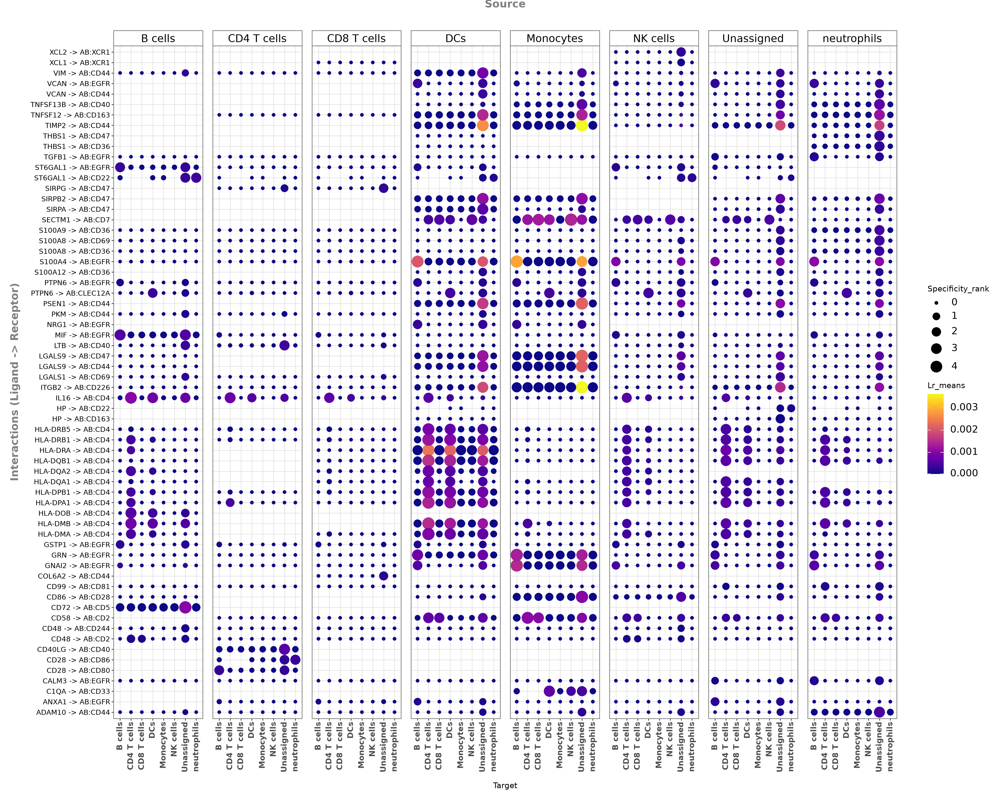

In [38]:
li.pl.dotplot(adata=mdata_free,
              uns_key='liana_res_rna_adt_free',
              colour='lr_means',
              size='specificity_rank',
              inverse_size=True,
              source_labels=lineages_free,  
              target_labels=lineages_free,
              figure_size=(20, 16),
              filter_fun=lambda x: x['cellphone_pvals'] <= 0.05,
              cmap='plasma')

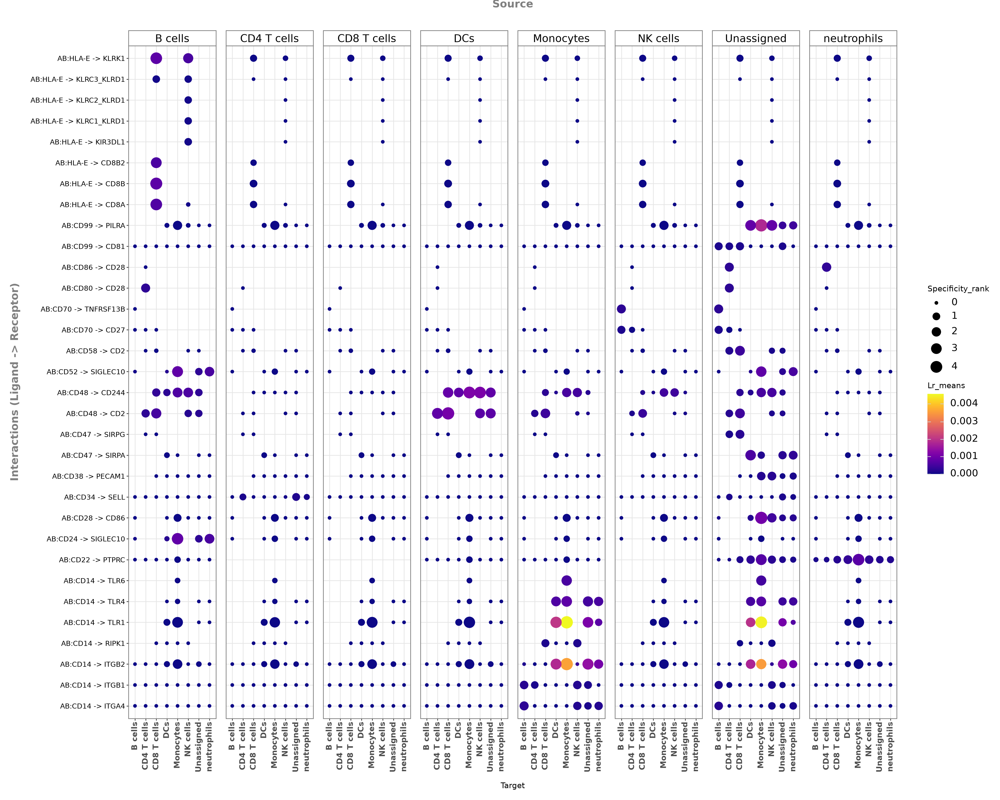

In [39]:
li.pl.dotplot(adata=mdata_free,
              uns_key='liana_res_adt_rna_free',   
              colour='lr_means',
              size='specificity_rank',
              inverse_size=True,
              source_labels=lineages_free,  
              target_labels=lineages_free,
              figure_size=(20,16),
              filter_fun=lambda x: x['cellphone_pvals'] <= 0.05,
              cmap='plasma')

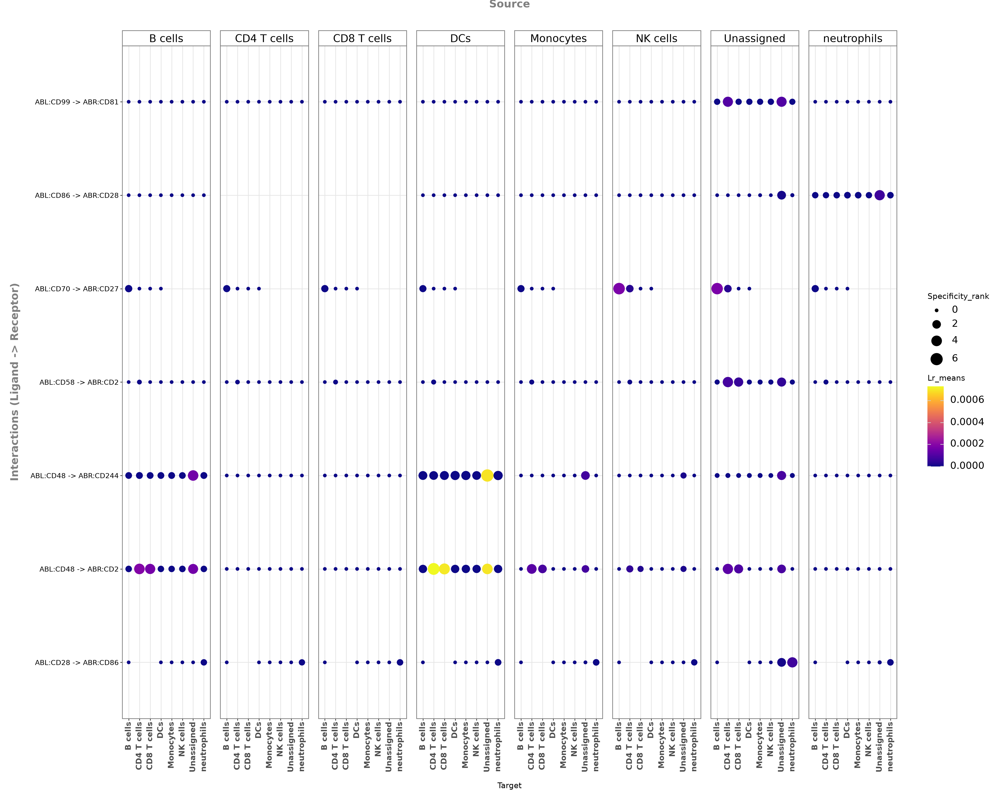

In [40]:

li.pl.dotplot(adata=mdata_free,
              uns_key='liana_res_adt_adt_free', 
              colour='lr_means',
              size='specificity_rank',
              inverse_size=True,
              source_labels=lineages_free,
              target_labels=lineages_free,
              figure_size=(20,16),
              filter_fun=lambda x: x['cellphone_pvals'] <= 0.05,
              cmap='plasma')

In [41]:
df_pla = mdata_pla.uns['liana_res_rna_adt_pla']
df_free = mdata_free.uns['liana_res_rna_adt_free']

merged = df_pla.merge(
    df_free, on=['source', 'target', 'ligand_complex', 'receptor_complex'],
    suffixes=('_pla', '_free'), how='outer', indicator=True
)

print(merged['_merge'].value_counts())
# 'left_only'  = interactions found ONLY in PLA
# 'right_only' = interactions found ONLY in platelet-free
# 'both'       = present in both

_merge
both          1559
right_only    1352
left_only      217
Name: count, dtype: int64


In [42]:
print(mdata_pla.obs['lineage'].value_counts())
print(mdata_free.obs['lineage'].value_counts())

lineage
Monocytes      20992
CD8 T cells     7504
CD4 T cells     5680
NK cells        2443
DCs             2298
B cells          488
Unassigned         0
neutrophils        0
Name: count, dtype: int64
lineage
Unassigned     117504
CD4 T cells     45049
NK cells        31768
B cells         20788
CD8 T cells     19400
neutrophils      4210
Monocytes        3479
DCs              3440
Name: count, dtype: int64


In [44]:
right_only = merged[merged['_merge'] == 'right_only']
missing_lineage_mask = (
    right_only['source'].isin(['neutrophils', 'Unassigned']) |
    right_only['target'].isin(['neutrophils', 'Unassigned'])
)
print(missing_lineage_mask.sum(), '/', len(right_only))

1327 / 1352


In [45]:
shared_lineages = set(mdata_pla.obs['lineage'].unique()) & set(mdata_free.obs['lineage'].unique())
print(shared_lineages)

merged_shared = merged[
    merged['source'].isin(shared_lineages) & merged['target'].isin(shared_lineages)
]
print(merged_shared['_merge'].value_counts())

{'Monocytes', 'NK cells', 'B cells', 'CD4 T cells', 'CD8 T cells', 'DCs'}
_merge
both          1559
left_only      217
right_only      25
Name: count, dtype: int64


- lr_means (dot color) = average expression level of the ligand and receptor in that specific source->target cell-type pair
    - magnitude measure: how strongly is this pair expressed here
- specificity rank (dot size) = aggregated rank (cellphonedb, connectome, natmi) combined via robust rank aggregation
    - how unique is this pair to this particular soruce->target combination, relative to every other cell-type pair in the same run
    - how much does this pair stnad out here versus everywhere else in this dataset

Why we have the same interactions BUT different dot sizes/colors:
- top interactions seems to be mainly driven by cell-identity markers (CD4 for CD4 T cells, CD14 marks monocytes, ...)
- this is indepenent of pla_status
- it is kind of expected that the same pairs recur across PLA, platelet-free and global runs
- what legitimately differs is the estimate of magnitude and specificity for that pair (noisier estimates due to smaller sample size tho)
- among cell types present in both groups, the large majority of interactions (1559) are shared -> lineage-driven
- raw dot-size differences between unequal-N runs are suggestive but confounded by sample size